# LMUNet: Infer LSMs

**ORIGINAL SOURCE:** [Top 100 solution - SIIM-ACR Pneumothorax Segmentation](https://amaarora.github.io/2020/09/06/siimacr.html#train-and-valid-augmentations)

The Data-structure should look like this (old names: 

```
├── data
│   ├── dataset512
│   ├── dicom-images-test
│   └── dicom-images-train
├── outputs
│   ├── dataset512
│   ├── dicom-images-test
│   └── dicom-images-train
├── data
│   ├── dataset512
│   ├── dicom-images-test
│   └── dicom-images-train
├── data
│   ├── dataset512
│   ├── dicom-images-test
│   └── dicom-images-train
├── data
├── data
├── data
├── data
├── data
├── data
├── data
├── data
├── data
└── src
    └── pneumothorax-segmentation 
```


## Preparations

### Imports

remove obsolete ones

In [1]:
#from LMUnet_Imports import import_modules
#%run LMUnet_Imports.py

In [29]:
import os
import torch
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, random_split
import torch.nn as nn
from torch.nn import MSELoss
from torcheval.metrics import MeanSquaredError, R2Score
from torcheval.metrics.functional import r2_score
import torch.nn.functional as F # for padding/interpolation

# dataset and unet (could also add to this file, hmm!
from unet_num_metr import unet#, Decoder

from LMUnet_custom_loss_functions import MSELossNan, HuberLossNan
from LMUnet_r2_one_by_one import r2_one_by_one, r2_one_by_one_dict, r2_nan
from LMUnet_visualization_functions import visualize

from DenormNameApplyNan import DenormNameApplyNan

# Optimization specific imports
from LMUnet_optimize_one_landscape import optimize_one_landscape
from LMUnet_connected_component_labeling import connected_component_labeling, find_largest_patch
from LMUnet_graph_operations import add_edges, get_largest_neighbor
from IPython.display import clear_output
import networkx as nx

### b) Config (Hyperparameters)

In [30]:
# Working with the original dataset, the test set.
#%run LMUnet_Config_57_metrics_reverse

In [31]:
TESTING_MODE = 'test_dataset'
#TESTING_MODE = 'example_landscape'
#TESTING_MODE = 'corine'

In [32]:
DATA_DIR         = Path(f'../notebooks/data')

METRIC_NAME = 'multi_metrics_66'
TRAIN_METRIC     = f'100k_5cl_{METRIC_NAME}'
METRIC_NAMES = pd.read_csv(f'data/{METRIC_NAME}.csv', header=None)[0]   

# Load list for which channel carries which metric
metr_norm        = pd.read_csv('metr_norm.csv', header=None).values.tolist()

TRAIN_LBL_DIR    = DATA_DIR/TRAIN_METRIC # 100k 5 class
OUTPUT_DIR       = Path(f'outputs/landscape_testiing/{TRAIN_METRIC}')
TRAIN_LOG        = OUTPUT_DIR/'output_log.txt'

print(TRAIN_LBL_DIR)
print(OUTPUT_DIR)

DEVICE           = 'cuda'
LEARNING_RATE    = 2e-5
EPOCHS           = 2000000 #10000000 #10000
LOSS_FN          = 'HL_NAN' #'MSE_NAN' #'HL_NAN' #'HL' # HuberLoss ['MSE','RMSE','MAE' 'HL is combined mae and ... rmse
EVAL_FN          = 'R2' # ['MSE']
USE_CRIT         = True
NUM_WORKERS      = 0 

FROM_PREDICTED = False


mean_std = 'mean_std.csv'
mean_std = pd.read_csv(mean_std, header=None)
mean_std = {mean_std.iloc[row][0]:[mean_std.iloc[row][1], mean_std.iloc[row][2]] for row in range(len(mean_std))}

# Nan metrics to add nan mask to when denormalizing
nan_metrics = pd.read_csv('nan_metrics.csv', header=None)[0].values.tolist()

../notebooks/data/100k_5cl_multi_metrics_66
outputs/landscape_testiing/100k_5cl_multi_metrics_66


In [129]:
if TESTING_MODE == 'test_dataset':
        
    TRAIN_IMG_DIR    = DATA_DIR/'100k_landscapes_5_class' # 5 class 100k
    TRAIN_DF         = pd.read_csv('data/100k_joinent_5_class_metric_list.csv', header=None) #100k 5 class
    
    # Split into training, validation and testing dataset
    DATASET_LENGHTS  = [80000,15000,5000]
    #INPUT_LS_DIR = 'data/100k_random_landscape_noises'
    full_dataset = LandscapeMetricsDataset(TRAIN_DF, TRAIN_IMG_DIR, TRAIN_LBL_DIR, 
                                               metr_norm=metr_norm, mean_std=mean_std)

    # Which landscape from the test dataset to work with
    LS_NUMBER = 10 #95001 # 11

    # Generate split with same sets as original training due to seed
    train_dataset, valid_dataset, test_dataset = random_split(dataset=full_dataset, 
                                                            lengths=DATASET_LENGHTS,
                                                            generator=torch.Generator().manual_seed(42))

    # Assign targets
    target_landscape, target_metric = test_dataset[LS_NUMBER]['landscape'], test_dataset[LS_NUMBER]['metric']

# If predicting the example landscape
elif TESTING_MODE == 'example_landscape':
    target_landscape = np.load('data/example_landscape/example_landscape_landscape/ls_example_landscape_reflect.npy')
    #target_metric    = np.load('data/example_landscape/example_landscape_multi_metrics_52/metr_example_landscape.npy')
    target_metric    = np.load('data/example_landscape/ex_ls_padded_metrics_normalized.npy')

# If predicting the corine landscape
elif TESTING_MODE == 'corine':
    target_landscape = np.load('data/example_landscape_corine/corine_goettingen_padded_stacked.npy')
    # to be added properly
    ##target_metric    = np.load('data/example_landscape/example_landscape_multi_metrics_52/metr_example_landscape.npy')
    
    
# Sanity check; Should be 1,1,128,128, 1,57,128,128
target_landscape.shape, target_metric.shape

(torch.Size([1, 128, 128]), torch.Size([57, 128, 128]))

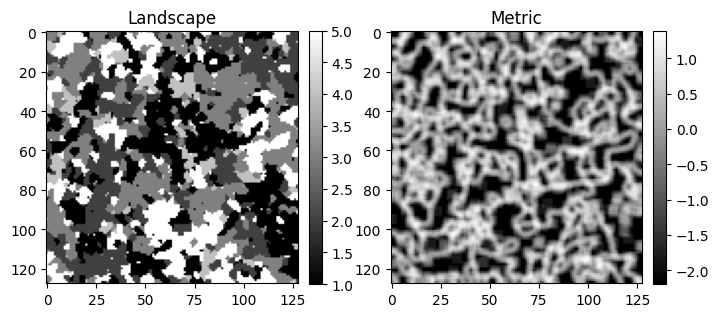

In [34]:
# Visualize target landscape and metric
visualize(target_landscape.squeeze(), 
          target_metric[51].squeeze())

## Loss and Model

### i) Loss

In [35]:
#%run LMUnet_custom_loss_functions.py

In [36]:
if LOSS_FN == 'MAE':
    criterion = nn.L1Loss()

elif LOSS_FN == 'MSE' or LOSS_FN == 'RMSE':
    criterion = nn.MSELoss()  

elif LOSS_FN == 'HL':
    criterion = nn.HuberLoss()
    
elif LOSS_FN == 'MSE_NAN':
    criterion = MSELossNan()
    
elif LOSS_FN == 'HL_NAN':
    criterion = HuberLossNan()
    
criterion

HuberLossNan()

### j) Model

From [PyTorch Segmentation Models](https://github.com/qubvel/segmentation_models.pytorch):

In [37]:
#%run unet_num_metr.py

In [38]:
NUM_METRICS = target_metric.shape[0]

# Conventionally:
model = unet(num_metr=NUM_METRICS)

# For Binary one hot:
#model = unet(enc_chs=(4,64,128,256,512), num_metr=NUM_METRICS)

#model = model.half()

In [39]:
# Original reduced learning rate
PRETRAINED_PATH = 'outputs/saved_models/100k_5cl_multi_metrics_66_adjusted/bst_model_100k_5cl_multi_metrics_66_bs:16_nw:0_nm:57_lf:HL_NAN_ep:34_0.9707_lr:8.1e-07.bin'

# Padding with reflect and normalized input
#PRETRAINED_PATH = 'outputs/saved_models/100k_5cl_multi_metrics_66_ls_norm/bst_model_100k_5cl_multi_metrics_66_bs:16_nw:0_nm:57_lf:HL_NAN_ep:78_0.9545_lr:2.0e-05.bin'

# Add noise
#PRETRAINED_PATH = 'outputs/saved_models/100k_5cl_multi_metrics_66_add_noise/bst_model_100k_5cl_multi_metrics_66_bs:16_nw:0_nm:57_lf:HL_NAN_ep:68_0.9282_lr:1.9e-07.bin'

# Binary pretrained
#PRETRAINED_PATH = 'outputs/saved_models/100k_5cl_multi_metrics_66_one_hot/bst_model_100k_5cl_multi_metrics_66_bs:16_nw:0_nm:57_lf:HL_NAN_ep:98_0.9689_lr:2.0e-05.bin'

# Load pretrained model
model.load_state_dict(torch.load(PRETRAINED_PATH))

# If optimizing from the predicted metrics instead of the original ones
if FROM_PREDICTED:
    target_metric = model(target_landscape.unsqueeze(0))

# Infer metrics

In [40]:
# Load your landscape (if not done above)
target_landscape = np.load('...')

FileNotFoundError: [Errno 2] No such file or directory: '...'

In [42]:
# Convert to tensor and add to device (if not done above)
target_landscape = torch.from_numpy(target_landscape).to('cuda').to(torch.float32)

TypeError: expected np.ndarray (got Tensor)

In [43]:
# Ensure that landscape is of shape B, C, H, W
# If not: target_landscape.unsqueeze(0) to add empty dimension
target_landscape.shape, target_metric.shape

(torch.Size([1, 128, 128]), torch.Size([57, 128, 128]))

In [45]:
# Predict LSMs
predicted_metric = model(target_landscape.unsqueeze(0))

In [ ]:
# Calulate average loss score for all metrics
loss_score = criterion(predicted_metric, target_metric)

In [50]:
predicted_metric.shape, target_metric.unsqueeze(0).shape

(torch.Size([1, 57, 128, 128]), torch.Size([1, 57, 128, 128]))

In [51]:
# Calculate r2 score for every individual metric
r2_scores = r2_one_by_one(predicted_metric[0], target_metric)

In [58]:
r2_scores[0][41]

0.9992402791976929

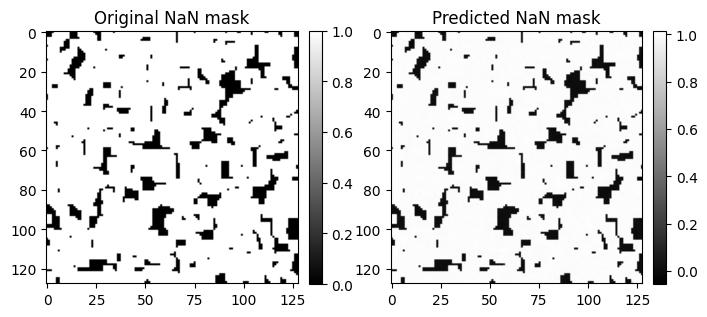

In [67]:
visualize(target_metric[0], 
              predicted_metric[0][0],
          left_title='Original NaN mask',
          right_title='Predicted NaN mask',
          
         )

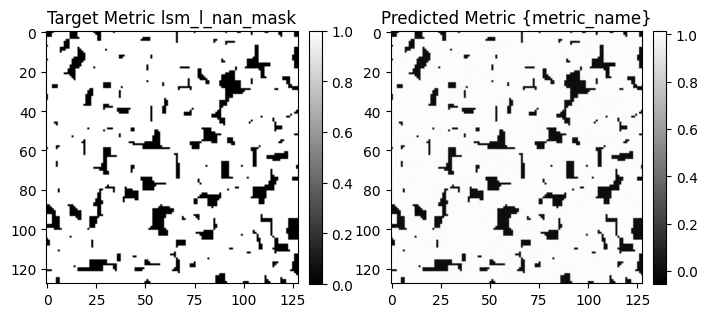

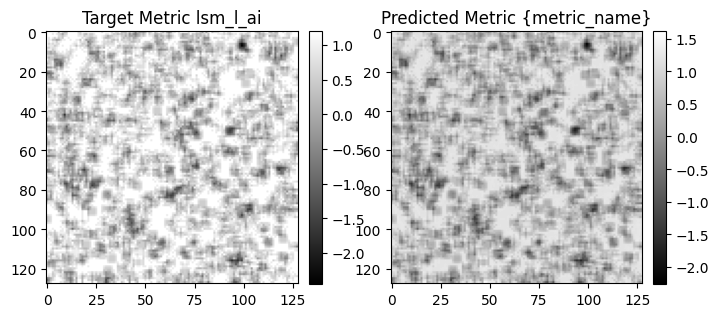

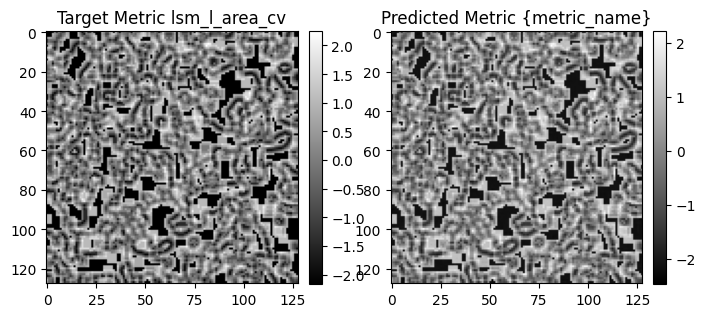

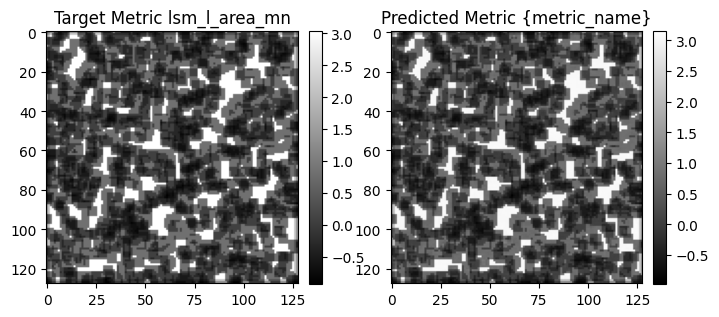

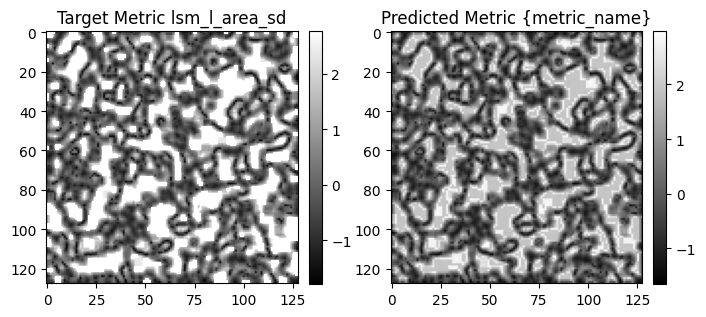

...

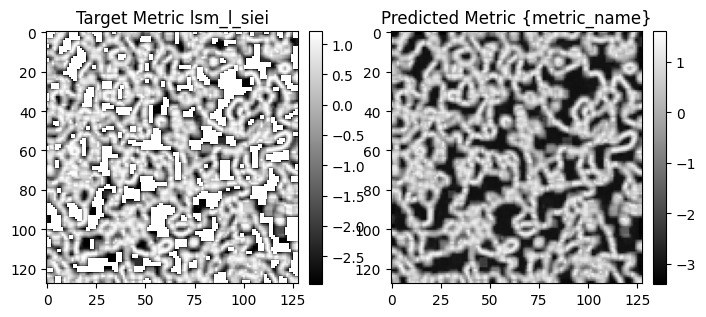

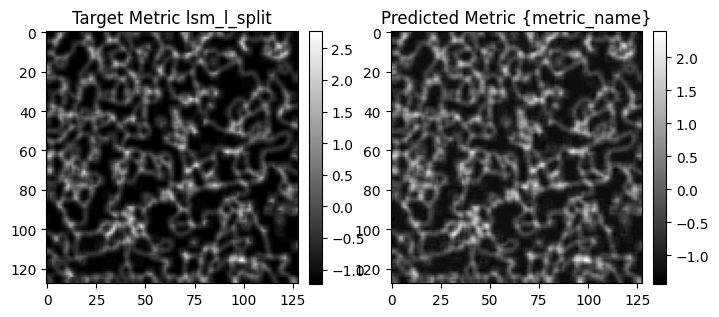

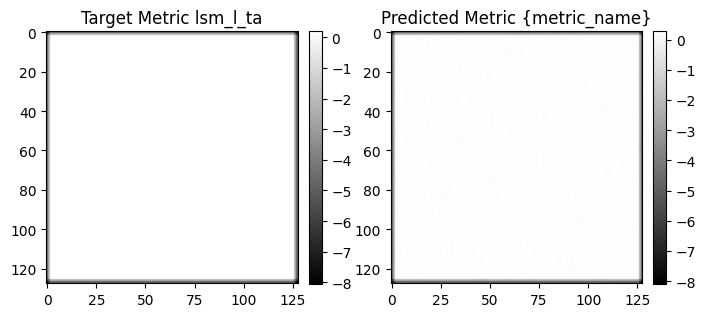

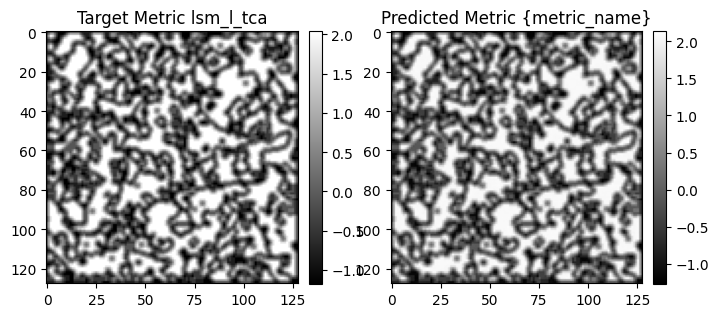

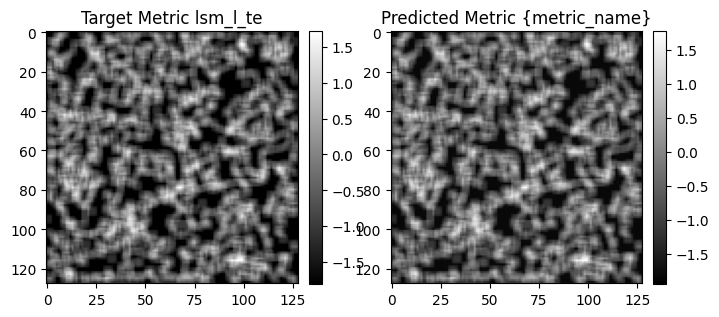

In [55]:
# Visualize all predicted metrics next to target metric
for metric_num in range(57):
    metric_name = metr_norm[metric_num][1]
    visualize(target_metric[metric_num], 
              predicted_metric[0][metric_num], 
              left_title=f'Target Metric {metric_name}', 
              right_title='Predicted Metric {metric_name}',
              # optionally: save images to file
             #savefilepath=f'..._{metric_name}.png'
             )

In [ ]:
# Save predicted_metric.npy to file:
np.save('file_path.npy', predicted_metric)

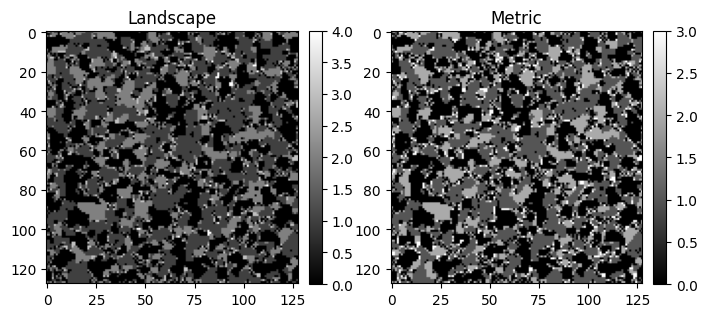

In [28]:
visualize(div_15,div_20)

In [100]:
nan_metrics

['lsm_l_ai',
 'lsm_l_area_cv',
 'lsm_l_area_mn',
 'lsm_l_area_sd',
 'lsm_l_cai_cv',
 'lsm_l_cai_mn',
 'lsm_l_cai_sd',
 'lsm_l_circle_cv',
 'lsm_l_circle_sd',
 'lsm_l_cohesion',
 'lsm_l_contag',
 'lsm_l_core_cv',
 'lsm_l_core_sd',
 'lsm_l_dcore_cv',
 'lsm_l_dcore_sd',
 'lsm_l_frac_sd',
 'lsm_l_msiei',
 'lsm_l_para_cv',
 'lsm_l_para_sd',
 'lsm_l_shape_cv',
 'lsm_l_shape_sd',
 'lsm_l_siei']

In [113]:
%run DenormNameApplyNan.py

In [114]:
denormed_nan_predictions = DenormNameApplyNan(predicted_metric, mean_std=mean_std, metr_norm=metr_norm, nan_metrics=nan_metrics)

In [115]:
denormed_nan_predictions

{'lsm_l_nan_mask': tensor([[-0., 0., -0.,  ..., 1., 0., -0.],
         [0., -0., -0.,  ..., 1., -0., -0.],
         [0., -0., 0.,  ..., 1., 0., 0.],
         ...,
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.]], grad_fn=<RoundBackward0>),
 'lsm_l_ai': tensor([[     nan,      nan,      nan,  ...,  98.0523,      nan,      nan],
         [     nan,      nan,      nan,  ...,  96.8116,      nan,      nan],
         [     nan,      nan,      nan,  ..., 100.0474,      nan,      nan],
         ...,
         [ 77.9170,  82.6333,  88.0512,  ...,  92.8999,  96.0108,  99.3672],
         [ 75.3976,  83.4749,  90.8710,  ...,  91.0596,  90.4645,  98.3992],
         [ 79.5200,  83.1783,  90.5796,  ...,  87.0108,  83.8098,  88.6903]],
        grad_fn=<AsStridedBackward0>),
 'lsm_l_area_cv': tensor([[     nan,      nan,      nan,  ..., 110.3293,      nan,      nan],
         [     nan,      nan,      nan,  ..., 119.9288,      nan

In [116]:
len(denormed_nan_predictions)

57

In [118]:
original_target_metric = target_metric

In [130]:
normalized_target_metric = target_metric

In [133]:
r2_nan(normalized_target_metric[13], predicted_metric[0][13])

tensor(0.9808)

In [132]:
normalized_target_metric.shape, predicted_metric.shape

(torch.Size([57, 128, 128]), torch.Size([1, 57, 128, 128]))

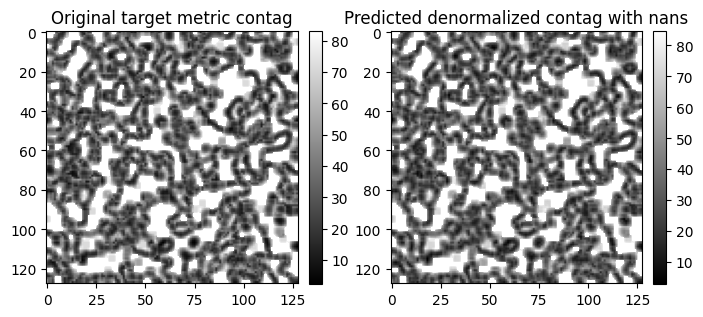

In [127]:
visualize(original_target_metric[13], denormed_nan_predictions['lsm_l_contag'],
         left_title='Original target metric contag',
         right_title='Predicted denormalized contag with nans')

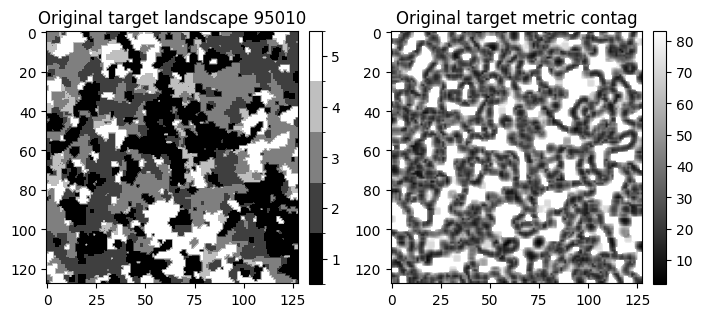

In [135]:
visualize(target_landscape[0], original_target_metric[13],
         left_title='Original target landscape 95010',
         right_title='Original target metric contag',
         left_disc=True)

In [128]:
r2_nan(original_target_metric[13], denormed_nan_predictions['lsm_l_contag'])

tensor(0.9808)

In [123]:
original_target_metric[41]

tensor([[80.0000, 82.9268, 80.0000,  ..., 69.0909, 82.9268, 80.0000],
        [82.9268, 85.7143, 82.6667,  ..., 74.6667, 85.7143, 82.9268],
        [80.0000, 82.6667, 80.0000,  ..., 74.0000, 82.6667, 80.0000],
        ...,
        [50.9091, 56.0000, 60.0000,  ..., 56.0000, 58.6667, 61.8182],
        [53.6585, 57.1429, 61.3333,  ..., 53.3333, 53.5714, 58.5366],
        [53.3333, 53.6585, 58.1818,  ..., 47.2727, 43.9024, 46.6667]])

In [137]:
rounded_optimized_lanscape = np.load('outputs/landscape_testiing/10_conventional/10_conventional_npy/ls_input_ls95010_HL_conventional_original_0.0858.npy')

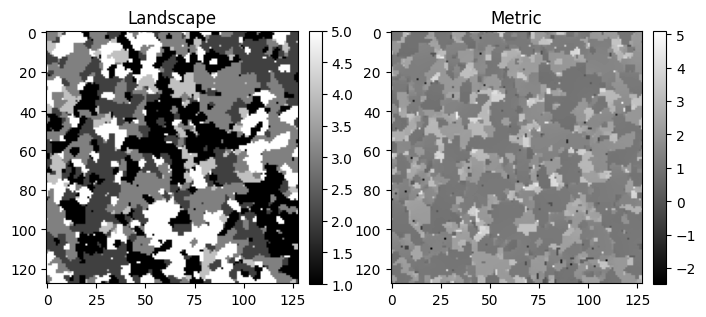

In [141]:
visualize(target_landscape[0], rounded_optimized_lanscape[0][0])

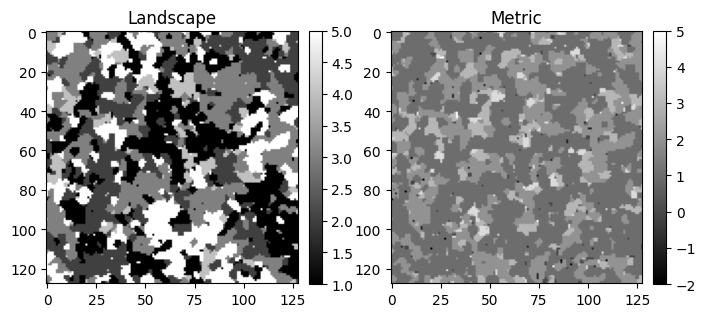

In [143]:
visualize(target_landscape[0], actually_rounded[0][0])

In [142]:
actually_rounded= np.round(rounded_optimized_lanscape)

In [144]:
np.unique(actually_rounded)

array([-2., -1.,  0.,  1.,  2.,  3.,  4.,  5.], dtype=float32)

In [147]:
ccl_ls = connected_component_labeling(rounded_optimized_lanscape[0][0], divisor=20)

In [151]:
ccl_ls[0].shape

(128, 128)

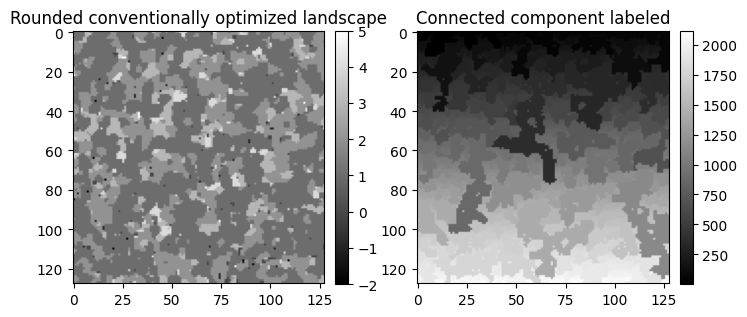

In [153]:
visualize(actually_rounded[0][0], ccl_ls[0],
         left_title='Rounded conventionally optimized landscape',
         right_title='Connected component labeled')

In [154]:
round_times_ten = np.round(rounded_optimized_lanscape*10)

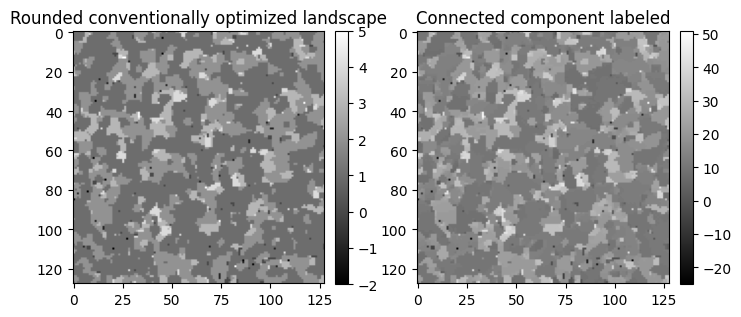

In [156]:
visualize(actually_rounded[0][0], round_times_ten[0][0],
         left_title='Rounded conventionally optimized landscape',
         right_title='Connected component labeled')

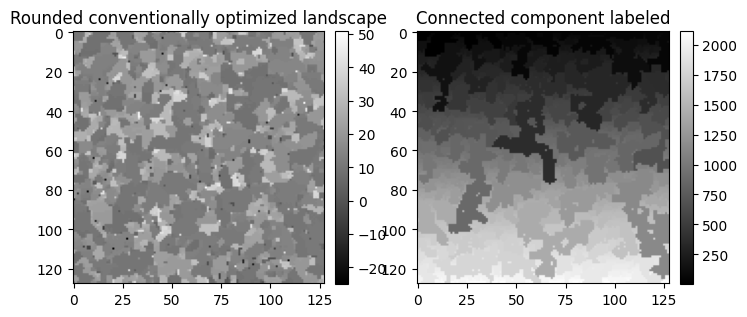

In [157]:
visualize(round_times_ten[0][0], ccl_ls[0],
         left_title='Rounded conventionally optimized landscape',
         right_title='Connected component labeled')

In [158]:
LPbP_10 = np.load('outputs/landscape_testiing/10_LPbP_comparisons/LPbP_output_npy/LPbP_10_output.npy')

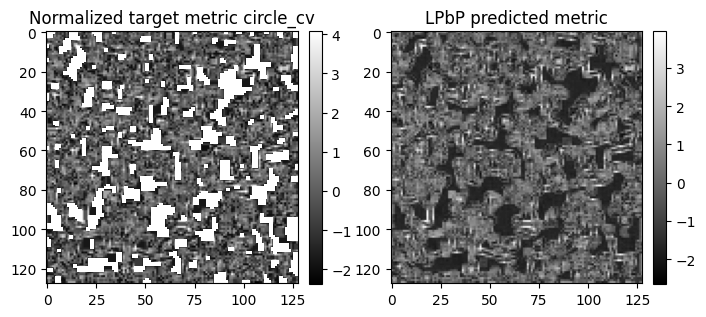

In [175]:
visualize(target_metric[8], LPbP_10[0][8],
         left_title='Normalized target metric circle_cv',
          right_title='LPbP predicted metric')

In [174]:
r2_nan(target_metric[8], torch.from_numpy(LPbP_10[0][8]))

tensor(0.5742)

In [168]:
r2_one_by_one(target_metric, torch.from_numpy(LPbP_10[0]))

([0.9838836193084717,
  0.7518128156661987,
  0.8795204162597656,
  0.9712378978729248,
  0.908496081829071,
  0.735011100769043,
  0.9723755717277527,
  0.9055337309837341,
  0.5741931200027466,
  0.8158659934997559,
  0.6142107248306274,
  0.9412553310394287,
  0.962836742401123,
  0.8878321647644043,
  0.728464663028717,
  0.9834170937538147,
  0.9444909691810608,
  0.7476636171340942,
  0.7416931390762329,
  0.9091475009918213,
  0.754647970199585,
  0.9545430541038513,
  0.9567797780036926,
  0.9478110074996948,
  0.8476663827896118,
  0.563464343547821,
  0.4647573232650757,
  0.9582567811012268,
  0.919201672077179,
  0.9570372104644775,
  0.9563984870910645,
  0.9267849922180176,
  0.8604234457015991,
  0.7814815640449524,
  0.7443339824676514,
  0.9170199036598206,
  'nan',
  0.8540167212486267,
  0.8971866369247437,
  0.8455555438995361,
  0.9198919534683228,
  0.9563490152359009,
  0.8664960861206055,
  0.8731639385223389,
  0.9482365250587463,
  'nan',
  0.7538297772407532,

In [176]:
ex_ls_conv = np.load('outputs/landscape_testiing/example_landscape_optim/ex_ls_conv_optim.npy')

In [180]:
ex_ls_ccl = connected_component_labeling(ex_ls_conv[0][0], divisor=20)

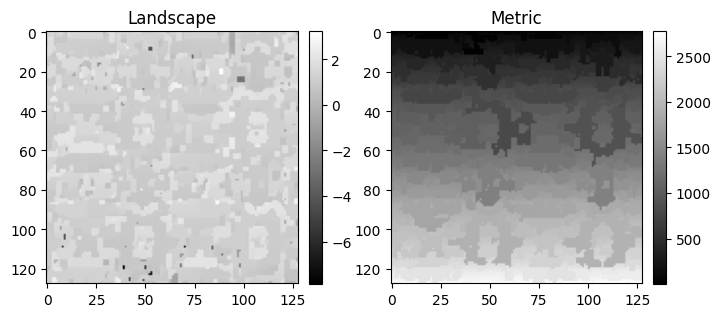

In [183]:
visualize(ex_ls_conv[0][0], ex_ls_ccl[0])